# **Objects Dataset**

## **Training**

### Reading dataset

In [1]:
from google.colab import drive
import cv2
import numpy as np
import os

#mounting drive to colab notebook, so that data can be read
drive.mount('/content/drive',force_remount=True)

#Reading training data. Class names are read and stored in a list
training_data_path = 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train'  
training_names = os.listdir(training_data_path)
print(training_names)

#storing image paths and theire corresponding labels
def imglist(path):    
    return [os.path.join(path, f) for f in os.listdir(path)]

class_id = 0
train_image_paths = []
train_image_labels = []

for training_name in training_names:
    dir = os.path.join(training_data_path, training_name)
    class_path = imglist(dir)
    train_image_labels+=[class_id]*len(class_path)
    train_image_paths+=class_path
    class_id+=1

#displaying some of the paths and labels
print(train_image_paths)
print(train_image_labels)


Mounted at /content/drive
['accordion', 'Soccer_Ball', 'motorbike', 'dollar_bill']
['drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0012.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0002.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0021.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0013.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0016.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0007.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0014.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0001.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0003.jpg', 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/acc

### Feature Extraction

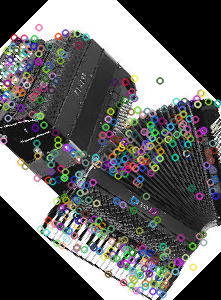

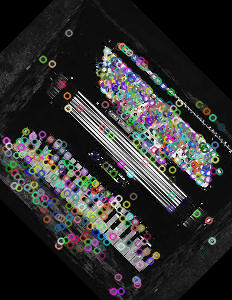

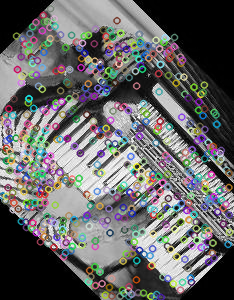

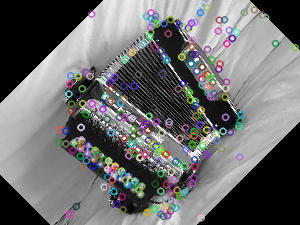

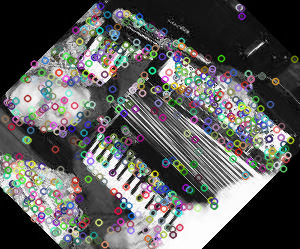

...

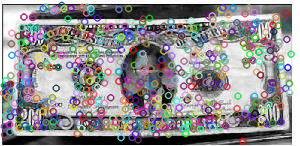

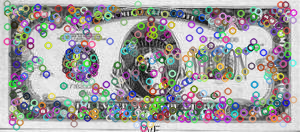

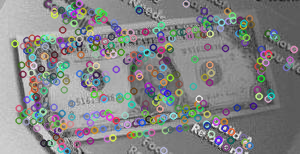

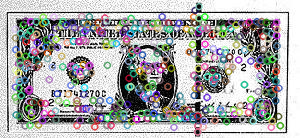

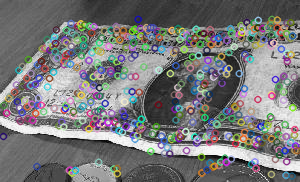

In [2]:
from google.colab.patches import cv2_imshow
import cv2 as cv

#SIFT feature detector is used to extract features
sift = cv2.xfeatures2d.SIFT_create()
#orb = cv.ORB_create()
#star = cv.xfeatures2d.StarDetector_create()
#brief = cv.xfeatures2d.BriefDescriptorExtractor_create()


#feature descriptors are stored in the array descriptor_list
descriptor_list = []

for i in range(0,len(train_image_paths)): 
  img=cv2.imread(train_image_paths[i])
  gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  frames,descriptors = sift.detectAndCompute(img, None)
  #kp=orb.detect(img,None)
  #frames,descriptors=orb.compute(img,kp)
  sift_image = cv2.drawKeypoints(gray_img, frames, img)
  # dsiplaying image with extracted features
  cv2_imshow(sift_image)
  descriptor_list.append((train_image_paths[i], descriptors)) 



In [3]:
descriptor_list

[('drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0012.jpg',
  array([[ 0.,  1.,  2., ...,  0.,  0.,  0.],
         [69., 56., 35., ...,  5.,  2.,  8.],
         [20.,  1.,  3., ...,  1.,  4.,  1.],
         ...,
         [ 2.,  0.,  0., ...,  0.,  0.,  0.],
         [ 0.,  0.,  0., ..., 13.,  0.,  0.],
         [41., 19.,  0., ...,  0.,  0.,  0.]], dtype=float32)),
 ('drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0002.jpg',
  array([[  4.,  11.,   0., ...,  26.,  33.,  46.],
         [  0.,  10.,  50., ..., 121.,  65.,   6.],
         [  2.,   5.,  63., ...,   0.,   0.,   0.],
         ...,
         [  6.,   1.,   0., ...,   0.,   4., 143.],
         [  9.,   3.,   3., ...,   2.,   2.,  65.],
         [ 35.,   4.,   0., ...,   5.,   4.,   0.]], dtype=float32)),
 ('drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/train/accordion/image_0021.jpg',
  array([[ 6.,  3.,  1., ...,  0.,  0.,  0.],
         [ 0.,

### Codebook Construction

In [4]:
from scipy.cluster.vq import kmeans, vq

#Visual vocabulary is formed by clustering.

descript = descriptor_list[0][1]

for img_path, descriptor in descriptor_list[1:]:
    descriptors = np.vstack((descript, descriptor))  

#k-means clustering and vector quantization
descriptors_to_float = descriptors.astype(float) 

k = 200  #this is a parameter which can be varied, this value gave good accuracy in my case
vocab, variation = kmeans(descriptors_to_float, k, 1)
print(vocab[:3]) 

 

[[125.66666667  11.           0.           7.          51.33333333
    2.           0.           4.66666667  67.           8.66666667
    0.66666667  25.         125.66666667   9.           0.
    2.         125.66666667  11.66666667   0.33333333   6.66666667
   80.           9.66666667   0.33333333   5.          65.66666667
   10.33333333   0.33333333  10.33333333 110.          12.33333333
    0.66666667   5.66666667 125.66666667  12.33333333   0.
    3.33333333  68.          16.66666667   2.66666667  15.66666667
   80.33333333  12.66666667   1.          34.         125.66666667
   30.33333333   5.66666667  10.66666667 125.66666667  23.
    1.           9.33333333  81.          19.           5.33333333
   26.33333333  70.           6.           0.33333333  13.33333333
  117.          35.33333333  10.33333333  17.33333333  46.33333333
    0.33333333   0.           0.33333333  24.66666667  51.66666667
   50.          69.          23.66666667   0.33333333   0.
    0.66666667  59.        

In [5]:
#Frequency is calculated using historgrams

image_features = np.zeros((len(train_image_paths), k), "float32")

#vq assigns codes from code book to observations.
for i in range(len(train_image_paths)):
    terms, dist = vq(descriptor_list[i][1],vocab)
    for w in terms:
        image_features[i][w] += 1

nbr_occurences = np.sum( (image_features > 0) * 1, axis = 0)
idf = np.array(np.log((1.0*len(train_image_paths)+1) / (1.0*nbr_occurences + 1)), 'float32')


In [6]:
from sklearn.preprocessing import StandardScaler

#Normalizing features
stdSlr = StandardScaler()
scale=stdSlr.fit(image_features)
image_features = scale.transform(image_features)

### Classification using SVM

In [7]:
import joblib
from sklearn.svm import LinearSVC

# Classification of images based on vocabulary generated using SVM.
classifier= LinearSVC(max_iter=100000)  
classifier.fit(image_features, np.array(train_image_labels))

#sklearns joblib package is used to save and reload the trained classifier model
joblib.dump((classifier, training_names, scale, k, vocab), "bovw_SVM.pkl", compress=3)  

['bovw_SVM.pkl']



---



## **Testing**

In [8]:
import cv2
import numpy as np
import os
import pylab as pl
from sklearn.metrics import confusion_matrix, accuracy_score
import joblib


# Loading the classifier model, class names, scaler, number of clusters and vocabulary from saved file
model, classes, stdSlr, k, vocab = joblib.load("bovw_SVM.pkl")

# Getting path of the testing images and putting them into a list
test_data_path = 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/test'  
testing_names = os.listdir(test_data_path)
testing_names.append("dollar_bill")
del(testing_names[1])
print(testing_names)

#listing all file names in a directory 
def imglist(path):
    return [os.path.join(path, f) for f in os.listdir(path)]

# Storing image_paths and the corresponding label of those images
class_id = 0
test_image_paths = []
test_image_labels = []


for testing_name in testing_names:
    dir = os.path.join(test_data_path, testing_name)
    class_path = imglist(dir)
    test_image_labels+=[class_id]*len(class_path)
    test_image_paths+=class_path
    class_id+=1
    




['accordian', 'Soccer_Ball', 'motorbike', 'dollar_bill']


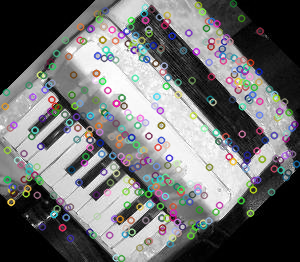

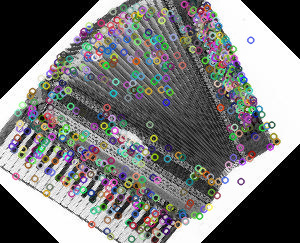

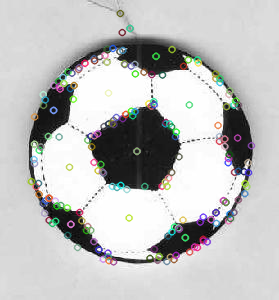

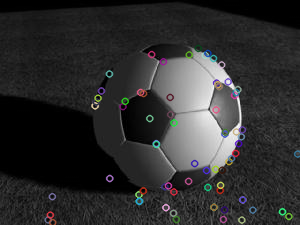

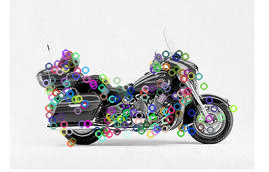

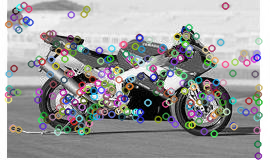

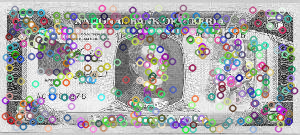

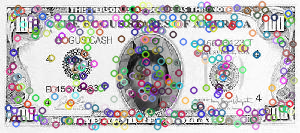

In [9]:
# detecting features from test images
sift = cv2.xfeatures2d.SIFT_create()
#orb = cv.ORB_create()
#storing all descriptors in a list 
descriptors_list = []

for i in range(0,len(test_image_paths)):
  img=cv2.imread(test_image_paths[i])
  gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  frames,descriptors = sift.detectAndCompute(img, None)
  #kp =orb.detect(img,None)
  #frames,descriptors = orb.compute(img, kp)
  #drawing keypoints on test images
  sift_image = cv2.drawKeypoints(gray_img,frames, img)

  #displaying test images with extracted features
  cv2_imshow(sift_image)
  descriptors_list.append((test_image_paths[i], descriptors)) 


In [10]:
from scipy.cluster.vq import vq    

# Stack all the descriptors in a numpy array
descriptors = descriptors_list[0][1]
for image_path, descriptor in descriptors_list[0:]:
    descriptors = np.vstack((descriptors, descriptor)) 

# Calculate histograms

test_features = np.zeros((len(test_image_paths), k), "float32")
for i in range(len(test_image_paths)):
    terms, dist = vq(descriptors_list[i][1],vocab)
    for w in terms:
        test_features[i][w] += 1

# Vectorization
nbr_occurences = np.sum( (test_features > 0) * 1, axis = 0)
idf = np.array(np.log((1.0*len(test_image_paths)+1) / (1.0*nbr_occurences + 1)), 'float32')



In [11]:
# Scaling features
test_features = stdSlr.transform(test_features)


#Putting original labels in true_class
true_class =  [classes[i] for i in test_image_labels]
print ("true_classes ="  + str(true_class))

#Predictions  
predictions =  [classes[i] for i in model.predict(test_features)]
print ("predicted classes ="  + str(predictions))

#Accuracy 
accuracy = accuracy_score(true_class, predictions)
print ("accuracy = ", accuracy*100)




true_classes =['accordion', 'accordion', 'Soccer_Ball', 'Soccer_Ball', 'motorbike', 'motorbike', 'dollar_bill', 'dollar_bill']
predicted classes =['Soccer_Ball', 'accordion', 'Soccer_Ball', 'Soccer_Ball', 'motorbike', 'motorbike', 'dollar_bill', 'dollar_bill']
accuracy =  87.5


[[2 0 0 0]
 [1 1 0 0]
 [0 0 2 0]
 [0 0 0 2]]


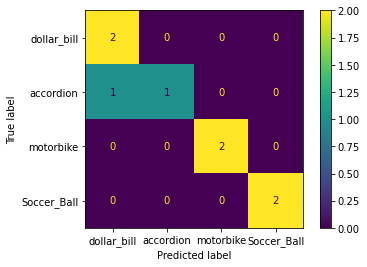

In [12]:

# displaying confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(true_class, predictions)
print(cm)
cmd = ConfusionMatrixDisplay(cm, display_labels=['dollar_bill','accordion', 'motorbike', 'Soccer_Ball'])
cmd.plot()

### Classification using Random Forest

In [13]:
import joblib
from sklearn.ensemble import RandomForestClassifier

#Classification of images based on vocabulary generated using Random forest.
classifier2 = RandomForestClassifier(n_estimators = 100, random_state=20)
classifier2.fit(image_features, np.array(train_image_labels))

#sklearns joblib package is used to save and reload the trained classifier model
joblib.dump((classifier2, training_names, scale, k, vocab), "bovw_RF.pkl", compress=3)  

['bovw_RF.pkl']

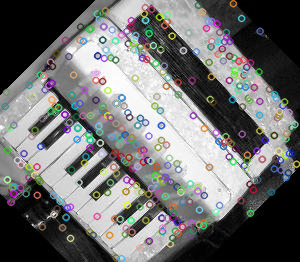

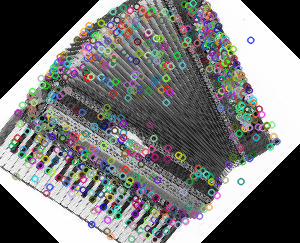

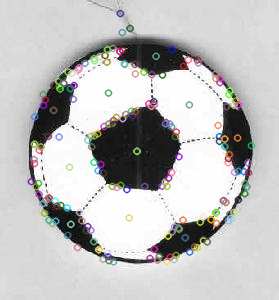

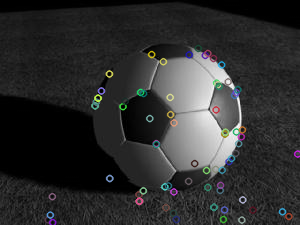

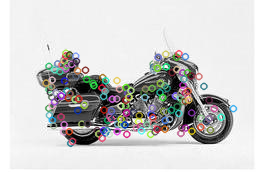

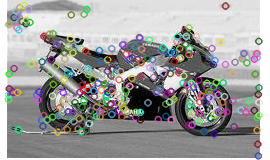

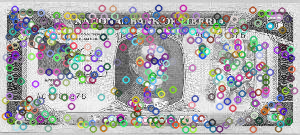

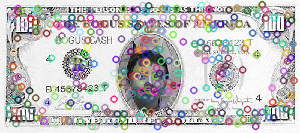

true_classes =['accordion', 'accordion', 'Soccer_Ball', 'Soccer_Ball', 'motorbike', 'motorbike', 'dollar_bill', 'dollar_bill']
predicted classes =['accordion', 'accordion', 'Soccer_Ball', 'Soccer_Ball', 'motorbike', 'motorbike', 'dollar_bill', 'dollar_bill']
accuracy =  100.0
[[2 0 0 0]
 [0 2 0 0]
 [0 0 2 0]
 [0 0 0 2]]


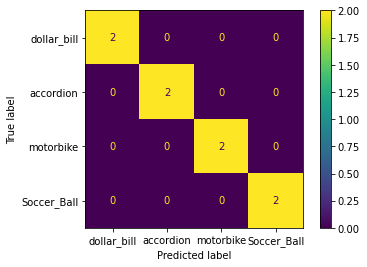

In [ ]:
import cv2
import numpy as np
import os
import pylab as pl
from sklearn.metrics import confusion_matrix, accuracy_score
import joblib
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scipy.cluster.vq import vq 

# Loading the classifier model, class names, scaler, number of clusters and vocabulary from saved file
model, classes, stdSlr, k, vocab = joblib.load("bovw_RF.pkl")

# Getting path of the testing images and putting them into a list
test_data_path = 'drive/My Drive/Colab Notebooks/CV-A1/Objects_Dataset_Images/test'  
testing_names = os.listdir(test_data_path)
testing_names.append("dollar_bill")
del(testing_names[1])
#print(testing_names)


#listing all file names in a directory 
def imglist(path):
    return [os.path.join(path, f) for f in os.listdir(path)]

# Storing image_paths and the corresponding label of those images
class_id = 0
test_image_paths = []
test_image_labels = []

for testing_name in testing_names:
    dir = os.path.join(test_data_path, testing_name)
    class_path = imglist(dir)
    test_image_paths+=class_path
    test_image_labels+=[class_id]*len(class_path)
    class_id+=1

# detecting features from test images
sift = cv2.xfeatures2d.SIFT_create()
#orb = cv.ORB_create()
#storing all descriptors in a list 
descriptors_list = []

for i in range(0,len(test_image_paths)):
  img=cv2.imread(test_image_paths[i])
  gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  #kp = orb.detect(img,None)
  frames,descriptors = sift.detectAndCompute(img, None)
  #frames,descriptors=orb.compute(img, kp)

  #drawing keypoints on test images
  sift_image = cv2.drawKeypoints(gray_img,frames, img)
  
  #displaying test images with extracted features
  cv2_imshow(sift_image)
  descriptors_list.append((test_image_paths[i], descriptors)) 


   

# Stack all the descriptors in a numpy array
descriptors = descriptors_list[0][1]
for image_path, descriptor in descriptors_list[0:]:
    descriptors = np.vstack((descriptors, descriptor)) 

# Calculate histograms

test_features = np.zeros((len(test_image_paths), k), "float32")
for i in range(len(test_image_paths)):
    terms, dist = vq(descriptors_list[i][1],vocab)
    for w in terms:
        test_features[i][w] += 1

# Vectorization
nbr_occurences = np.sum( (test_features > 0) * 1, axis = 0)
idf = np.array(np.log((1.0*len(test_image_paths)+1) / (1.0*nbr_occurences + 1)), 'float32')


# Scaling features
test_features = stdSlr.transform(test_features)


#Putting original labels in true_class
true_class2 =  [classes[i] for i in test_image_labels]
print ("true_classes ="  + str(true_class2))

#Predictions  
predictions2 =  [classes[i] for i in model.predict(test_features)]
print ("predicted classes ="  + str(predictions2))



#Accuracy 
accuracy = accuracy_score(true_class2, predictions2)
print ("accuracy = ", accuracy*100)



# displaying confusion matrix

cm2 = confusion_matrix(true_class2, predictions2)
print(cm2)
cmd = ConfusionMatrixDisplay(cm2, display_labels=['dollar_bill','accordion', 'motorbike', 'Soccer_Ball'])
cmd.plot()



## **Evaluations**

### F1 score

In [ ]:
from sklearn.metrics import f1_score

svm=f1_score(true_class, predictions, average=None)
rf=f1_score(true_class2, predictions2, average=None)
print("f1 score with SVM", svm)
print("f1 score with Random forest", rf)


f1 score with SVM [0.8        0.66666667 1.         1.        ]
f1 score with Random forest [1. 1. 1. 1.]


 
### Accuracy, True Positive Rate, False Positive Rates

In [ ]:
FP = cm.sum(axis=0) - np.diag(cm)  
FN = cm.sum(axis=1) - np.diag(cm)
TP = np.diag(cm)
TN = 8 - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)

# Fall out or false positive rate
FPR = FP/(FP+TN)

# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)


FP2 = cm2.sum(axis=0) - np.diag(cm2)  
FN2 = cm2.sum(axis=1) - np.diag(cm2)
TP2 = np.diag(cm2)
TN2 = 8 - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR2 = TP2/(TP2+FN2)

# Fall out or false positive rate
FPR2 = FP2/(FP2+TN2)

# Overall accuracy
ACC2 = (TP2+TN2)/(TP2+FP2+FN2+TN2)

print("Accuracy with SVM", ACC)
print("Accuracy with Random forest", ACC2, "\n")

print("true positive rate with SVM", TPR )
print("true positive rate with Random forest", TPR2,"\n")

print("false positive rate with SVM", FPR)
print("false positive rate with Random forest", FPR2)

Accuracy with SVM [0.875 0.875 1.    1.   ]
Accuracy with Random forest [1. 1. 1. 1.] 

true positive rate with SVM [1.  0.5 1.  1. ]
true positive rate with Random forest [1. 1. 1. 1.] 

false positive rate with SVM [0.16666667 0.         0.         0.        ]
false positive rate with Random forest [0. 0. 0. 0.]


### Qualitative Results

SVM

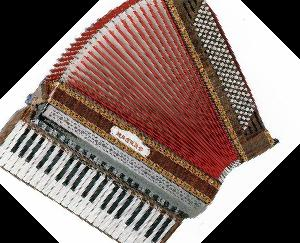

Actual label: accordion
Predicted label: accordion




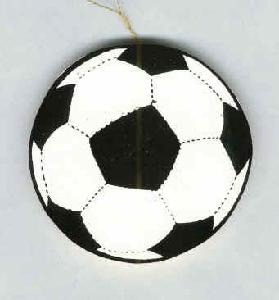

Actual label: Soccer_Ball
Predicted label: Soccer_Ball




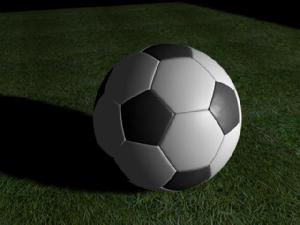

Actual label: Soccer_Ball
Predicted label: Soccer_Ball




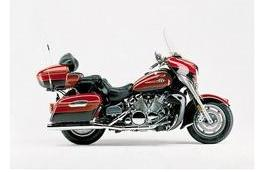

Actual label: motorbike
Predicted label: motorbike




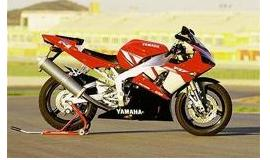

Actual label: motorbike
Predicted label: motorbike




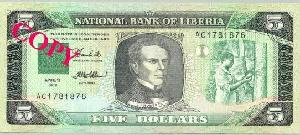

Actual label: dollar_bill
Predicted label: dollar_bill




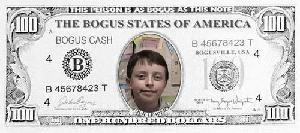

Actual label: dollar_bill
Predicted label: dollar_bill




In [14]:
for i in range(0,len(test_image_paths)):
  if(true_class[i]==predictions[i]):
    img=cv2.imread(test_image_paths[i])
    cv2_imshow(img)
    print("Actual label:",true_class[i])
    print("Predicted label:",predictions[i])
    print("\n")

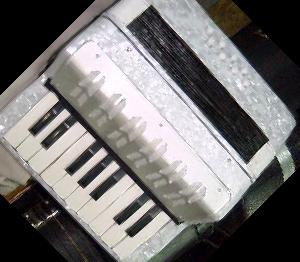

Actual label: accordion
Predicted label: Soccer_Ball




In [15]:
for i in range(0,len(test_image_paths)):
  if(true_class[i]!=predictions[i]):
    img=cv2.imread(test_image_paths[i])
    cv2_imshow(img)
    print("Actual label:",true_class[i])
    print("Predicted label:",predictions[i])
    print("\n")

Random forest

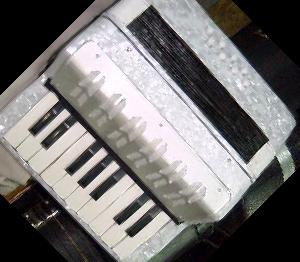

Actual label: accordion
Predicted label: accordion




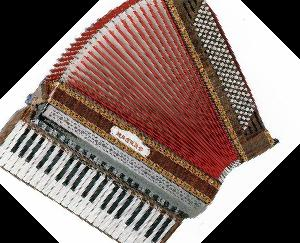

Actual label: accordion
Predicted label: accordion




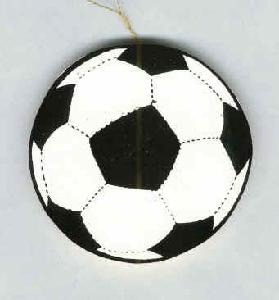

Actual label: Soccer_Ball
Predicted label: Soccer_Ball




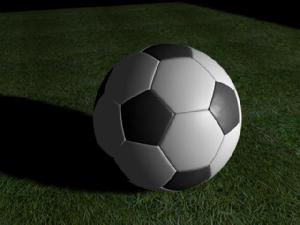

Actual label: Soccer_Ball
Predicted label: Soccer_Ball




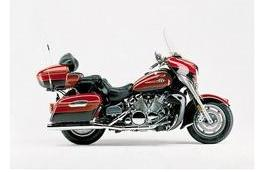

Actual label: motorbike
Predicted label: motorbike




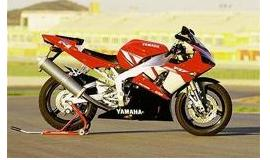

Actual label: motorbike
Predicted label: motorbike




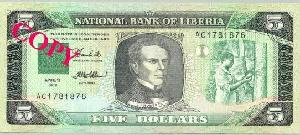

Actual label: dollar_bill
Predicted label: dollar_bill




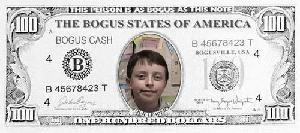

Actual label: dollar_bill
Predicted label: dollar_bill




In [ ]:
for i in range(0,len(test_image_paths)):
  img=cv2.imread(test_image_paths[i])
  cv2_imshow(img)
  print("Actual label:",true_class2[i])
  print("Predicted label:",predictions2[i])
  print("\n")



---



---

